# Student's ID's :

Charalambous Ioannis - 0035000

Papazisimou Nikoletta - 0035000

Tselios Ioannis - 0035000



## Introduction

This notebook provides a comprehensive analysis of the breast cancer dataset. We will explore the data, preprocess it, and apply various machine learning models including neural networks. Additionally, we will perform adversarial training to evaluate model robustness and use LIME and saliency maps for model interpretation.

## Data Loading and Preprocessing

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import numpy as np
import lime
import lime.lime_tabular

# Define the URL for the dataset
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data"

# Define the column names
column_names = [
    'ID', 'Diagnosis', 'Radius Mean', 'Texture Mean', 'Perimeter Mean', 'Area Mean', 'Smoothness Mean',
    'Compactness Mean', 'Concavity Mean', 'Concave Points Mean', 'Symmetry Mean', 'Fractal Dimension Mean',
    'Radius SE', 'Texture SE', 'Perimeter SE', 'Area SE', 'Smoothness SE', 'Compactness SE', 'Concavity SE',
    'Concave Points SE', 'Symmetry SE', 'Fractal Dimension SE', 'Radius Worst', 'Texture Worst', 'Perimeter Worst',
    'Area Worst', 'Smoothness Worst', 'Compactness Worst', 'Concavity Worst', 'Concave Points Worst', 'Symmetry Worst',
    'Fractal Dimension Worst'
]

# Read the dataset into a pandas DataFrame
df = pd.read_csv(url, header=None, names=column_names)

# Display the first few rows of the DataFrame
df.head()

,ID,Diagnosis,Radius Mean,Texture Mean,Perimeter Mean,Area Mean,Smoothness Mean,Compactness Mean,Concavity Mean,Concave Points Mean,...,Radius Worst,Texture Worst,Perimeter Worst,Area Worst,Smoothness Worst,Compactness Worst,Concavity Worst,Concave Points Worst,Symmetry Worst,Fractal Dimension Worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


This cell loads the breast cancer dataset from a specified URL and reads it into a pandas DataFrame. The dataset contains various features related to breast cancer diagnostics.

In [2]:
print(df.shape)
#We have 569 patients

(569, 32)


Here we see that the breast cancer dataset has 569 samples of 30 features and a label category called Diagnosis with two values 'Begign' and 'Malignant'.

In [3]:
#Find Null Vales
print(df.isnull().sum())

ID                         0
Diagnosis                  0
Radius Mean                0
Texture Mean               0
Perimeter Mean             0
Area Mean                  0
Smoothness Mean            0
Compactness Mean           0
Concavity Mean             0
Concave Points Mean        0
Symmetry Mean              0
Fractal Dimension Mean     0
Radius SE                  0
Texture SE                 0
Perimeter SE               0
Area SE                    0
Smoothness SE              0
Compactness SE             0
Concavity SE               0
Concave Points SE          0
Symmetry SE                0
Fractal Dimension SE       0
Radius Worst               0
Texture Worst              0
Perimeter Worst            0
Area Worst                 0
Smoothness Worst           0
Compactness Worst          0
Concavity Worst            0
Concave Points Worst       0
Symmetry Worst             0
Fractal Dimension Worst    0
dtype: int64


Here we see that the dataset has no missing values

<AxesSubplot: xlabel='count', ylabel='Diagnosis'>

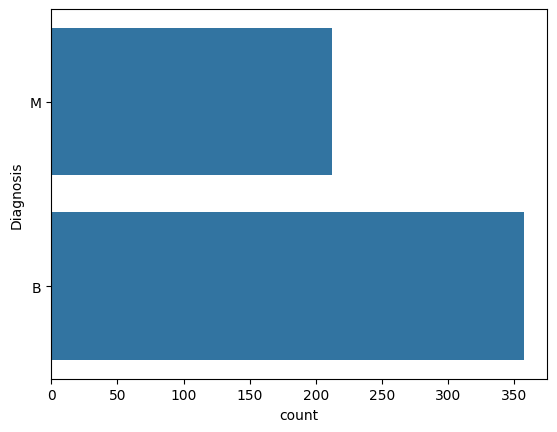

In [4]:
sns.countplot(df['Diagnosis'],label='count')

Here we see the distribution of the samples into the two classes the dataset doesn't seem to have big imbalances.

C:\Users\giannos\AppData\Local\Temp\ipykernel_17428\939827659.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.iloc[:,1:12].corr(), annot=True, cmap='coolwarm')


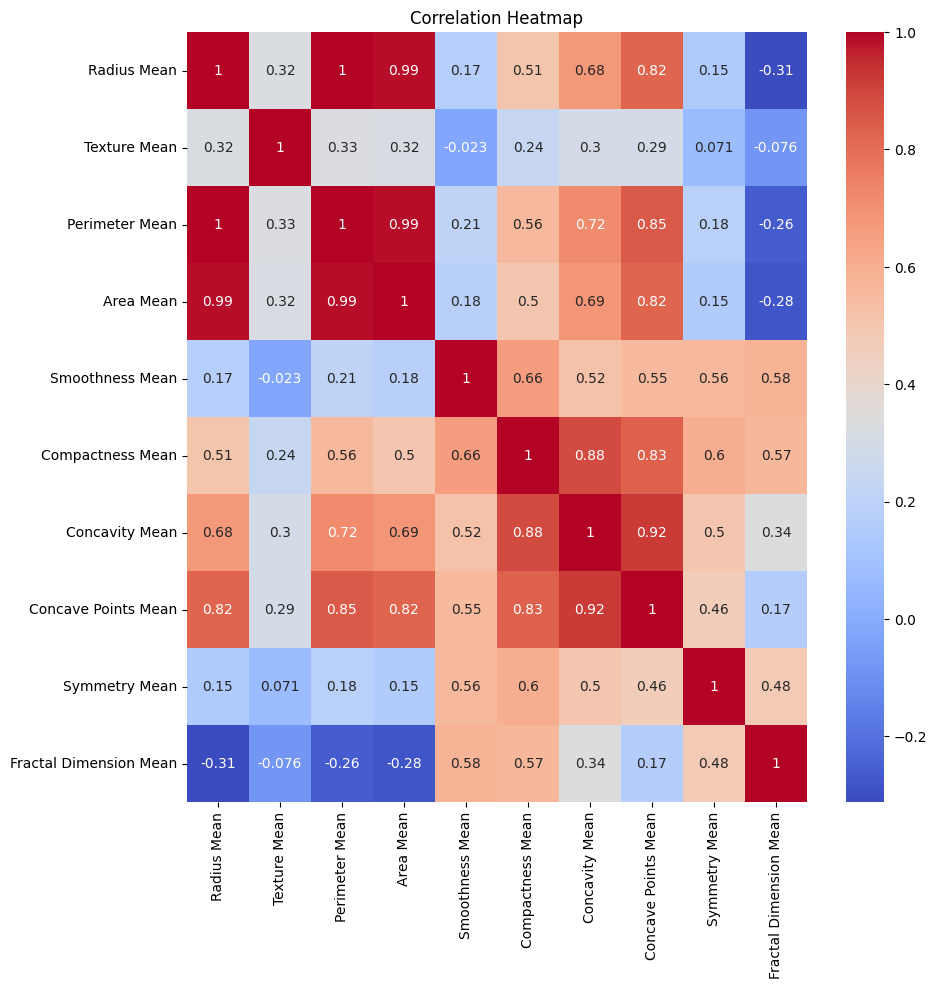

In [5]:
# Visualize the correlation
plt.figure(figsize=(10,10))

sns.heatmap(df.iloc[:,1:12].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

The heatmap shows the correlation between different features in the breast cancer dataset. The color intensity represents the strength of the correlation: red indicates a strong positive correlation, blue indicates a negative correlation, and lighter colors show weaker correlations. Notably, "Radius Mean," "Perimeter Mean," and "Area Mean" are highly correlated with each other, indicating that as one of these features increases, the others are likely to increase as well. Similarly, "Compactness Mean," "Concavity Mean," and "Concave Points Mean" also show strong correlations. We are gonna use all the features nonetheless.

In [6]:
X = df.iloc[:, 2:].values
y = df.iloc[:, 1].values

labelencoder = preprocessing.LabelEncoder()
y = labelencoder.fit_transform(y)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize the dataset
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

This cell preprocesses the dataset by encoding the target labels, splitting the data into training and testing sets, and standardizing the features.

## Building and Training Models

This script builds and trains a neural network using TensorFlow and Keras for binary classification. The model includes three layers: an input layer with 30 neurons and ReLU activation, a hidden layer with 15 neurons and ReLU activation, and an output layer with a single neuron and sigmoid activation. It is compiled with the Adam optimizer and binary cross-entropy loss function, and trained for 50 epochs with a batch size of 32 and a validation split of 20%. The final model achieves an accuracy of 98.83% with a training loss of 0.0712.

In [7]:
# Build and train the neural network
model_1 = Sequential([
    Dense(30, input_shape=(X_train.shape[1],), activation='relu'),
    Dense(15, activation='relu'),
    Dense(1, activation='sigmoid')
])

model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history_1 = model_1.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

loss_1, accuracy_1 = model_1.evaluate(X_test, y_test)
print(f"Neural Network Model Accuracy: {accuracy_1}")


Epoch 1/50
10/10 [==============================] - 2s 24ms/step - loss: 0.5616 - accuracy: 0.6981 - val_loss: 0.5117 - val_accuracy: 0.7000
Epoch 2/50
10/10 [==============================] - 0s 5ms/step - loss: 0.4709 - accuracy: 0.8239 - val_loss: 0.4308 - val_accuracy: 0.8250
Epoch 3/50
10/10 [==============================] - 0s 6ms/step - loss: 0.4064 - accuracy: 0.8962 - val_loss: 0.3708 - val_accuracy: 0.8750
Epoch 4/50
10/10 [==============================] - 0s 6ms/step - loss: 0.3533 - accuracy: 0.9182 - val_loss: 0.3231 - val_accuracy: 0.8875
Epoch 5/50
10/10 [==============================] - 0s 6ms/step - loss: 0.3074 - accuracy: 0.9277 - val_loss: 0.2781 - val_accuracy: 0.9375
Epoch 6/50
10/10 [==============================] - 0s 6ms/step - loss: 0.2659 - accuracy: 0.9277 - val_loss: 0.2392 - val_accuracy: 0.9375
Epoch 7/50
10/10 [==============================] - 0s 6ms/step - loss: 0.2288 - accuracy: 0.9371 - val_loss: 0.2081 - val_accuracy: 0.9375
Epoch 8/50
10/10 [=

This script trains a second neural network models using TensorFlow and Keras for binary classification. Model 2 has five layers (50, 25, 15, 10, and 1 neuron) with dropout layers to prevent overfitting. It achieves 98.83% accuracy with a 0.078 test loss. Model 1 has slightly lower loss, while Model 2 is built to handle overfitting better.

In [8]:
model_2 = Sequential([
    Dense(50, input_shape=(X_train.shape[1],), activation='relu'),
    Dropout(0.5),
    Dense(25, activation='relu'),
    Dropout(0.5),
    Dense(15, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='relu'),
    Dense(1, activation='sigmoid')
])

model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model_2.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Evaluate the second model
loss_2, accuracy_2 = model_2.evaluate(X_test, y_test)
print(f"Model 2 Accuracy: {accuracy_2}")


Epoch 1/50
10/10 [==============================] - 1s 25ms/step - loss: 0.7628 - accuracy: 0.5849 - val_loss: 0.6582 - val_accuracy: 0.7375
Epoch 2/50
10/10 [==============================] - 0s 8ms/step - loss: 0.7257 - accuracy: 0.6164 - val_loss: 0.6280 - val_accuracy: 0.8125
Epoch 3/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6408 - accuracy: 0.6384 - val_loss: 0.5911 - val_accuracy: 0.8625
Epoch 4/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6163 - accuracy: 0.7138 - val_loss: 0.5525 - val_accuracy: 0.8625
Epoch 5/50
10/10 [==============================] - 0s 7ms/step - loss: 0.5756 - accuracy: 0.7233 - val_loss: 0.5079 - val_accuracy: 0.9000
Epoch 6/50
10/10 [==============================] - 0s 8ms/step - loss: 0.5615 - accuracy: 0.7327 - val_loss: 0.4649 - val_accuracy: 0.9000
Epoch 7/50
10/10 [==============================] - 0s 7ms/step - loss: 0.5553 - accuracy: 0.7673 - val_loss: 0.4277 - val_accuracy: 0.9125
Epoch 8/50
10/10 [=

## Model Evaluation

A saliency map is a visualization technique used to understand the importance of each input feature in the decision-making process of a neural network. It highlights the regions in the input data that have the most significant influence on the model's predictions. The saliency map in the code uses the gradient method to highlight important features. Specifically, it computes the gradients of the loss function with respect to the input features to determine the sensitivity of the model's predictions to changes in the input. The magnitude of these gradients indicates the importance of each feature, with larger magnitudes suggesting greater importance. This method helps in understanding which parts of the input data the model relies on most for making predictions.

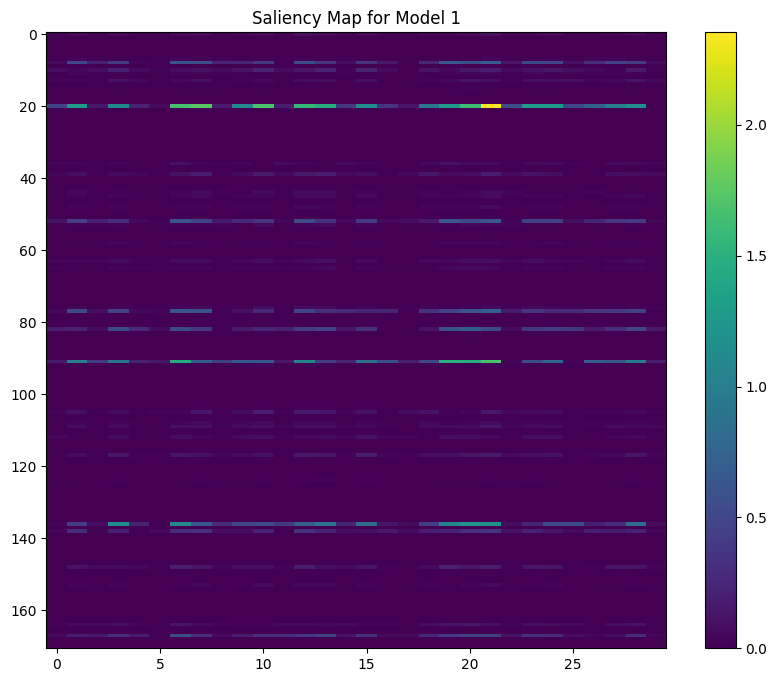

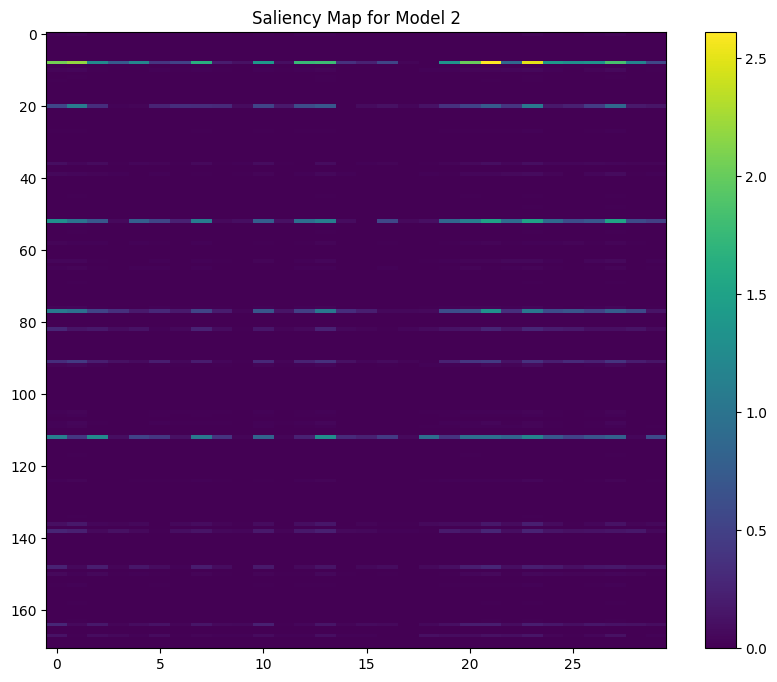

In [9]:
def generate_saliency_map(model, X, y):
    X_tensor = tf.convert_to_tensor(X, dtype=tf.float32)
    y_tensor = tf.convert_to_tensor(y, dtype=tf.float32)
    y_tensor = tf.reshape(y_tensor, [-1, 1])
    with tf.GradientTape() as tape:
        tape.watch(X_tensor)
        predictions = model(X_tensor)
        loss = tf.keras.losses.binary_crossentropy(y_tensor, predictions)
    gradients = tape.gradient(loss, X_tensor)
    saliency = np.abs(gradients.numpy())
    return saliency, predictions.numpy()


saliency_map_1, predictions_1 = generate_saliency_map(model_1, X_test, y_test)


plt.figure(figsize=(10, 8))
plt.imshow(saliency_map_1, cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('Saliency Map for Model 1')
plt.show()

saliency_map_2, predictions_2 = generate_saliency_map(model_2, X_test, y_test)


plt.figure(figsize=(10, 8))
plt.imshow(saliency_map_2, cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('Saliency Map for Model 2')
plt.show()


The maps use color intensity to represent feature importance, with brighter areas indicating higher significance. In the given saliency maps for two different models, Model 1 and Model 2, we observe differences in the distribution of important features.  For Model 1, the saliency values show a relatively uniform distribution with some concentrated areas indicating higher sensitivity to specific features. In contrast, Model 2 exhibits higher maximum saliency values, indicating that certain features have a more pronounced impact on its decision-making process compared to Model 1. This comparison highlights how different models can interpret and prioritize the same data differently, which is crucial for understanding their decision-making processes, especially in the context of evaluating model robustness and the impact of adversarial attacks.

## Adversarial Attack on Dataset and Model Training

The Fast Gradient Sign Method (FGSM) is an adversarial attack technique used to create misleading examples by slightly altering the input data to deceive a neural network into making incorrect predictions. This method involves calculating the gradient of the loss function with respect to the input data, which indicates how each feature influences the model's output. By adjusting the input data in the direction of the gradient, scaled by a small factor (epsilon), FGSM generates adversarial examples that are similar to the original inputs but strategically altered to exploit the model's vulnerabilities. These adversarial examples are crafted to push the model's predictions towards incorrect classifications, while the changes made are often minimal and subtle, making them difficult to detect. The effectiveness of FGSM lies in its ability to exploit the model's sensitivity to certain features, thereby challenging the model's robustness and highlighting potential weaknesses in its training.

In [10]:
def generate_fgsm_adversarial_examples(model, X, y, epsilon=0.1):
    X_adv = X.copy()
    for i in range(len(X)):
        X_tensor = tf.convert_to_tensor(X[i:i+1], dtype=tf.float32)
        y_tensor = tf.convert_to_tensor(y[i:i+1], dtype=tf.float32)
        y_tensor = tf.reshape(y_tensor, [-1, 1])
        with tf.GradientTape() as tape:
            tape.watch(X_tensor)
            predictions = model(X_tensor)
            loss = tf.keras.losses.binary_crossentropy(y_tensor, predictions)
        gradients = tape.gradient(loss, X_tensor)
        perturbations = epsilon * tf.sign(gradients).numpy()
        X_adv[i] = X[i] + perturbations
    return X_adv

epsilon = 0.1

This script demonstrates the generation of adversarial examples and their impact on training a neural network model for binary classification specifically model 1.

Initially, the FGSM method is applied to the training data (X_train), producing perturbed versions of the data designed to mislead the model into making incorrect predictions.

In [11]:
X_train_fgsm_1 = generate_fgsm_adversarial_examples(model_1, X_train, y_train, epsilon)
#X_test_fgsm_1 = generate_fgsm_adversarial_examples(model_1, X_test, y_test, epsilon)

fgsm_model_1 = Sequential([
    Dense(30, input_shape=(X_train.shape[1],), activation='relu'),
    Dense(15, activation='relu'),
    Dense(1, activation='sigmoid')
])

fgsm_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
fgsm_model_1.fit(X_train_fgsm_1, y_train, epochs=50, batch_size=32, validation_split=0.2)

loss_adversarial_1, accuracy_adversarial_1 = fgsm_model_1.evaluate(X_test, y_test)
print(f"FGSM Adversarial Model 1 Accuracy: {accuracy_adversarial_1}")

Epoch 1/50
10/10 [==============================] - 1s 21ms/step - loss: 0.5901 - accuracy: 0.7075 - val_loss: 0.4973 - val_accuracy: 0.8375
Epoch 2/50
10/10 [==============================] - 0s 7ms/step - loss: 0.4534 - accuracy: 0.8491 - val_loss: 0.3894 - val_accuracy: 0.8625
Epoch 3/50
10/10 [==============================] - 0s 6ms/step - loss: 0.3609 - accuracy: 0.9119 - val_loss: 0.3191 - val_accuracy: 0.9000
Epoch 4/50
10/10 [==============================] - 0s 7ms/step - loss: 0.2970 - accuracy: 0.9277 - val_loss: 0.2713 - val_accuracy: 0.9000
Epoch 5/50
10/10 [==============================] - 0s 7ms/step - loss: 0.2513 - accuracy: 0.9308 - val_loss: 0.2391 - val_accuracy: 0.9125
Epoch 6/50
10/10 [==============================] - 0s 6ms/step - loss: 0.2203 - accuracy: 0.9371 - val_loss: 0.2167 - val_accuracy: 0.9125
Epoch 7/50
10/10 [==============================] - 0s 7ms/step - loss: 0.1965 - accuracy: 0.9403 - val_loss: 0.2026 - val_accuracy: 0.9125
Epoch 8/50
10/10 [=

This cell evaluates the adversarially trained model 1 on the test set and prints the accuracy with lower value of 97% from 98.83 of model 1 trained on the original dataset.

In [12]:
X_train_fgsm_2 = generate_fgsm_adversarial_examples(model_2, X_train, y_train, epsilon)
#X_test_fgsm_2 = generate_fgsm_adversarial_examples(model_2, X_test, y_test, epsilon)

fgsm_model_2 = Sequential([
    Dense(50, input_shape=(X_train.shape[1],), activation='relu'),
    Dropout(0.5),
    Dense(25, activation='relu'),
    Dropout(0.5),
    Dense(15, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='relu'),
    Dense(1, activation='sigmoid')
])

fgsm_model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
fgsm_model_2.fit(X_train_fgsm_2, y_train, epochs=50, batch_size=32, validation_split=0.2)


loss_adversarial_2, accuracy_adversarial_2 = fgsm_model_2.evaluate(X_test, y_test)
print(f"FGSM Adversarial Model 2 Accuracy: {accuracy_adversarial_2}")

Epoch 1/50
10/10 [==============================] - 1s 25ms/step - loss: 0.7744 - accuracy: 0.4245 - val_loss: 0.7261 - val_accuracy: 0.2250
Epoch 2/50
10/10 [==============================] - 0s 8ms/step - loss: 0.7210 - accuracy: 0.4528 - val_loss: 0.6926 - val_accuracy: 0.4875
Epoch 3/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6949 - accuracy: 0.5377 - val_loss: 0.6738 - val_accuracy: 0.7000
Epoch 4/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6645 - accuracy: 0.5975 - val_loss: 0.6585 - val_accuracy: 0.7500
Epoch 5/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6559 - accuracy: 0.6447 - val_loss: 0.6413 - val_accuracy: 0.8125
Epoch 6/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6464 - accuracy: 0.6824 - val_loss: 0.6237 - val_accuracy: 0.8625
Epoch 7/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6357 - accuracy: 0.7358 - val_loss: 0.6062 - val_accuracy: 0.8625
Epoch 8/50
10/10 [=

We do the same on model 2 training with the adversarial examples. We evaluate with the original test set and the same accuracy of 98.83%. That happens because model 2 has more layers and a dropout layer and doesn't overfit easily so with pertubed data it has the same and often better performance than with the original one.

PGD is a powerful and iterative attack technique used to create adversarial inputs that can mislead a machine learning model. In this approach, small perturbations are iteratively applied to the original input data, aiming to maximize the model's prediction error. The process involves computing the gradient of the loss function with respect to the input, using these gradients to generate small perturbations, and then updating the adversarial examples. The amount of perturbation is controlled by two parameters: epsilon, which defines the maximum allowable perturbation, and alpha, which determines the step size in each iteration. The updated adversarial examples are then clipped to ensure they remain within the epsilon-ball around the original data, maintaining the integrity of the inputs. This iterative process continues for a specified number of iterations, creating robust adversarial examples that challenge the model's classification capabilities, thus testing the model's robustness to adversarial attacks.

In [13]:
def generate_pgd_adversarial_examples(model, X, y, epsilon=0.1, alpha=0.01, num_iterations=40):
    X_adv = X.copy()
    
    for i in range(num_iterations):
        # Compute gradients of the loss with respect to the input
        X_tensor = tf.convert_to_tensor(X_adv, dtype=tf.float32)
        y_tensor = tf.convert_to_tensor(y, dtype=tf.float32)
        y_tensor = tf.reshape(y_tensor, [-1, 1])
        
        with tf.GradientTape() as tape:
            tape.watch(X_tensor)
            predictions = model(X_tensor)
            loss = tf.keras.losses.binary_crossentropy(y_tensor, predictions)
        
        gradients = tape.gradient(loss, X_tensor)
        perturbations = alpha * tf.sign(gradients).numpy()
        
        # Apply perturbation and project back into the epsilon-ball
        X_adv = X_adv + perturbations
        X_adv = np.clip(X_adv, X - epsilon, X + epsilon)
        X_adv = np.clip(X_adv, 0, 1)  # Ensure the perturbed images are still valid
        
    return X_adv

# Example usage
# Assuming model_1 is a trained neural network
epsilon = 0.05
alpha = 0.005
num_iterations = 40

In the following cell, we create adversarial examples using the PGD adversarial attack method. We then use this data to train the simple Model 1 and subsequently evaluate its performance on the test set. 

In [14]:
X_train_pgd_1 = generate_pgd_adversarial_examples(model_1, X_train, y_train, epsilon)
#X_test_pgd_1 = generate_pgd_adversarial_examples(model_1, X_test, y_test, epsilon)

pgd_model_1 = Sequential([
    Dense(30, input_shape=(X_train.shape[1],), activation='relu'),
    Dense(15, activation='relu'),
    Dense(1, activation='sigmoid')
])

pgd_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
pgd_model_1.fit(X_train_pgd_1, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Evaluate on the original test set

loss_adversarial_1, accuracy_adversarial_1 = pgd_model_1.evaluate(X_test, y_test)
print(f"PGD Adversarial Model 1 Accuracy: {accuracy_adversarial_1}")

Epoch 1/50
10/10 [==============================] - 1s 23ms/step - loss: 0.7171 - accuracy: 0.5692 - val_loss: 0.6824 - val_accuracy: 0.6500
Epoch 2/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6510 - accuracy: 0.8145 - val_loss: 0.6371 - val_accuracy: 0.7875
Epoch 3/50
10/10 [==============================] - 0s 8ms/step - loss: 0.5986 - accuracy: 0.8679 - val_loss: 0.5953 - val_accuracy: 0.8500
Epoch 4/50
10/10 [==============================] - 0s 8ms/step - loss: 0.5486 - accuracy: 0.8994 - val_loss: 0.5509 - val_accuracy: 0.8500
Epoch 5/50
10/10 [==============================] - 0s 7ms/step - loss: 0.4983 - accuracy: 0.9308 - val_loss: 0.5068 - val_accuracy: 0.8750
Epoch 6/50
10/10 [==============================] - 0s 7ms/step - loss: 0.4497 - accuracy: 0.9434 - val_loss: 0.4663 - val_accuracy: 0.8750
Epoch 7/50
10/10 [==============================] - 0s 7ms/step - loss: 0.4032 - accuracy: 0.9497 - val_loss: 0.4292 - val_accuracy: 0.8750
Epoch 8/50
10/10 [=

The drop in Model 1's accuracy from 98.83% to 95.9% following the application of the PGD adversarial attack indicates a significant impact on the model's performance. This reduction in accuracy is primarily due to the model's increased focus on correctly classifying the adversarial examples during training, which often comes at the expense of its ability to generalize to normal, clean data. PGD attacks are designed to be particularly effective in creating challenging adversarial examples by iteratively optimizing the input perturbations to fool the model. During adversarial training, the model learns to handle these difficult examples, but this process can cause the model to shift its focus away from the broader patterns in the clean data, thus reducing its accuracy on such data.

The decrease from 98.83% to 95.91% shows the trade-off that while the model becomes more robust against adversarial attacks, its overall accuracy on clean test data is compromised. 

In [15]:
X_train_pgd_2 = generate_pgd_adversarial_examples(model_2, X_train, y_train, epsilon)
#X_test_pgd_2 = generate_pgd_adversarial_examples(model_2, X_test, y_test, epsilon)

pgd_model_2 = Sequential([
    Dense(50, input_shape=(X_train.shape[1],), activation='relu'),
    Dropout(0.5),
    Dense(25, activation='relu'),
    Dropout(0.5),
    Dense(15, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='relu'),
    Dense(1, activation='sigmoid')
])

pgd_model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
pgd_model_2.fit(X_train_pgd_2, y_train, epochs=50, batch_size=32, validation_split=0.2)

loss_adversarial_2, accuracy_adversarial_2 = pgd_model_2.evaluate(X_test, y_test)
print(f"PGD Adversarial Model 2 Accuracy: {accuracy_adversarial_2}")

Epoch 1/50
10/10 [==============================] - 1s 24ms/step - loss: 0.7016 - accuracy: 0.5346 - val_loss: 0.6800 - val_accuracy: 0.7750
Epoch 2/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6649 - accuracy: 0.6321 - val_loss: 0.6728 - val_accuracy: 0.7875
Epoch 3/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6655 - accuracy: 0.6384 - val_loss: 0.6606 - val_accuracy: 0.8000
Epoch 4/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6482 - accuracy: 0.6918 - val_loss: 0.6484 - val_accuracy: 0.8125
Epoch 5/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6419 - accuracy: 0.7170 - val_loss: 0.6335 - val_accuracy: 0.8375
Epoch 6/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6296 - accuracy: 0.7075 - val_loss: 0.6104 - val_accuracy: 0.8625
Epoch 7/50
10/10 [==============================] - 0s 8ms/step - loss: 0.6240 - accuracy: 0.7044 - val_loss: 0.5868 - val_accuracy: 0.8750
Epoch 8/50
10/10 [=

In Model 2 the accuracy dropped to 97% after adversarial training with the PGD attack. This is lower than the model's original accuracy but still higher than the accuracy observed in Model 1 after the same adversarial training. Model 2's design includes more layers and dropout mechanisms, which may contribute to its better resilience compared to Model 1. These architectural features can help the model generalize better by preventing overfitting to the adversarial examples, maintaining a higher level of accuracy on the clean test set. The accuracy of 97% suggests that while Model 2 did experience a performance hit due to adversarial training, it managed to retain a relatively higher accuracy compared to Model 1. This implies that Model 2's structure allows it to balance the trade-off between robustness and accuracy more effectively.

## Model Interpretation with LIME

This cell uses LIME to interpret the predictions of the original and adversarially trained models. LIME for tabular data works by creating a local surrogate model around the specific instance you want to explain. It generates a dataset of perturbed samples by slightly altering the features of the original instance, then uses the black-box model to predict outcomes for these samples. By fitting a simple, interpretable model like a linear regression to this locally perturbed dataset, LIME identifies the contribution of each feature to the prediction. This process helps understand which features were most influential in the model's decision-making for that particular instance, making it easier to interpret complex models like neural networks or ensemble methods.

In [16]:

def predict_proba(model, X):
    preds = model.predict(X)
    return np.hstack((1 - preds, preds))

# Lime for model_1 with original dataset
explainer = lime.lime_tabular.LimeTabularExplainer(X_test, feature_names=df.columns[2:], class_names=['benign', 'malignant'], discretize_continuous=True)

exp_1 = explainer.explain_instance(X_test[0], lambda x: predict_proba(model_1, x), num_features=5)
exp_1.show_in_notebook(show_all=False)

#Lime for model_1 with FGSM attack
explainer = lime.lime_tabular.LimeTabularExplainer(X_test, feature_names=df.columns[2:], class_names=['benign', 'malignant'], discretize_continuous=True)

exp_adv_1 = explainer.explain_instance(X_test[0], lambda x: predict_proba(fgsm_model_1, x), num_features=5)
exp_adv_1.show_in_notebook(show_all=False)

#Lime for model_1 with PGD attack
explainer = lime.lime_tabular.LimeTabularExplainer(X_test, feature_names=df.columns[2:], class_names=['benign', 'malignant'], discretize_continuous=True)

exp_adv_1 = explainer.explain_instance(X_test[0], lambda x: predict_proba(pgd_model_1, x), num_features=5)
exp_adv_1.show_in_notebook(show_all=True)

157/157 [==============================] - 0s 1ms/step


157/157 [==============================] - 0s 1ms/step


157/157 [==============================] - 0s 1ms/step


The LIME outputs for the model 1 trained on the original, FGSM, and PGD datasets provide insights into the feature importance and prediction probabilities for each model variant. For the original model, the prediction probabilities indicate a strong prediction for 'benign' 0.95, with key features like "Area Worst," "Compactness SE," and "Texture Worst" significantly influencing the model's decision. This suggests that these features had a notable impact on the model's output.

In the FGSM model 1, the benign prediction probability slightly increased to 0.97. The important features include "Texture Worst," "Perimeter Worst," and "Perimeter Mean," indicating a shift in the features the model considers most influential. This shift suggests that the FGSM attack has altered the model's sensitivity to certain features, possibly due to the adversarial perturbations highlighting or exaggerating different aspects of the data.

For the PGD-trained model 1, the benign prediction probability reaches 1.00, indicating an even stronger bias towards benign predictions. The features influencing this prediction include "Texture Worst," "Area Worst," and "Perimeter Worst," similar to the FGSM-trained model, but with additional features such as "Smoothness Worst" and "Symmetry Worst" being highlighted. This suggests that the PGD attack has caused the model to rely even more on specific features, possibly because these features were more robust to the adversarial perturbations or because the model has overfitted to the altered training data.

In [17]:
#LIME for model_2 with original dataset
explainer = lime.lime_tabular.LimeTabularExplainer(X_test, feature_names=df.columns[2:], class_names=['benign', 'malignant'], discretize_continuous=True)

exp_1 = explainer.explain_instance(X_test[0], lambda x: predict_proba(model_2, x), num_features=5)
exp_1.show_in_notebook(show_all=False)

#LIME for model_2 with FGSM attack
explainer = lime.lime_tabular.LimeTabularExplainer(X_test, feature_names=df.columns[2:], class_names=['benign', 'malignant'], discretize_continuous=True)

exp_adv_1 = explainer.explain_instance(X_test[0], lambda x: predict_proba(fgsm_model_2, x), num_features=5)
exp_adv_1.show_in_notebook(show_all=False)

#LIME for model_2 with PGD attack
explainer = lime.lime_tabular.LimeTabularExplainer(X_test, feature_names=df.columns[2:], class_names=['benign', 'malignant'], discretize_continuous=True)

exp_adv_1 = explainer.explain_instance(X_test[0], lambda x: predict_proba(pgd_model_2, x), num_features=5)
exp_adv_1.show_in_notebook(show_all=True)

157/157 [==============================] - 0s 1ms/step


157/157 [==============================] - 0s 1ms/step


157/157 [==============================] - 0s 1ms/step


For the original model 2, the benign prediction probability is 0.97, indicating a strong confidence in the prediction. The most important features influencing this prediction are "Area Worst," "Radius Mean," "Texture Worst," "Texture Mean," and "Perimeter Worst." These features significantly contribute to the model's decision, with "Area Worst" having the highest weight, suggesting that larger or more abnormal areas in the data are strongly associated with benign predictions.

In the FGSM model 2, the benign prediction probability slightly decreases to 0.95. Key features influencing this prediction include "Texture Worst," "Perimeter Worst," "Compactness SE," "Texture Mean," and "Area Worst." The slight decrease in probability and change in feature importance indicate that the FGSM attack has slightly altered the model's feature sensitivity, though it still predominantly predicts benign cases.

The PGD model 2 shows a benign prediction probability of 1.00, indicating a high level of confidence. The important features include "Area Worst," "Texture Worst," "Texture Mean," "Perimeter Worst," and "Compactness Mean." Similar to the original and FGSM models, the PGD model places significant emphasis on these features, but the increase in confidence suggests that the model may be overfitting to certain patterns in the adversarial examples.

## Model Interpretation with Saliency Maps

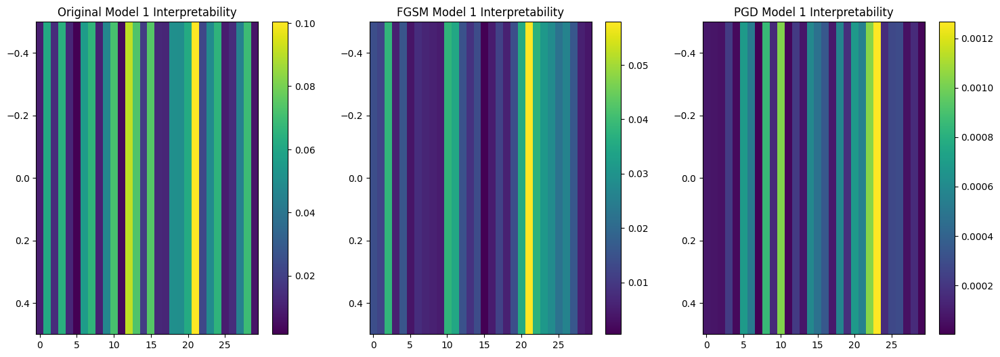

In [18]:
# Function to evaluate model interpretability
def evaluate_interpretability(model, X, y):
    # Generate saliency map for the entire dataset
    saliency_map, _ = generate_saliency_map(model, X, y)
    return saliency_map

# Evaluate interpretability for the original and adversarially trained models
interpretability_original_1 = evaluate_interpretability(model_1, X_test, y_test)
interpretability_fgsm_1 = evaluate_interpretability(fgsm_model_1, X_test, y_test)
interpretability_pgd_1 = evaluate_interpretability(pgd_model_1, X_test, y_test)

# Plot the interpretability results
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(interpretability_original_1[0].reshape(1, -1), cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('Original Model 1 Interpretability')

plt.subplot(1, 3, 2)
plt.imshow(interpretability_fgsm_1[0].reshape(1, -1), cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('FGSM Model 1 Interpretability')

plt.subplot(1, 3, 3)
plt.imshow(interpretability_pgd_1[0].reshape(1, -1), cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('PGD Model 1 Interpretability')

plt.show()


Original Model 1: This saliency map shows the influence of each feature on the model's predictions using the original training data. The color intensity indicates the strength of the contribution of each feature, with brighter colors signifying greater influence. The map suggests a relatively even distribution of importance across various features, indicating that the model utilizes a broad set of features to make predictions.

FGSM Model 1: After adversarial training with FGSM, the saliency map reveals subtle shifts in feature importance. There is a noticeable change in the color intensity compared to the original, with some features becoming more brighter or less. This suggests that the FGSM attack has led the model to adjust which features it considers most informative, possibly as a response to the adversarial perturbations introduced during training.

PGD Model 1: The saliency map for the model trained with PGD adversarial examples shows a significant reduction in color intensity compared to both the original and FGSM-trained models. This reduced intensity indicates that the model, under PGD adversarial training, spreads its attention more evenly across the features, or that it finds it harder to identify dominant features. This could imply that the PGD training has either made the model more robust or more confused, as it fails to rely strongly on particular features.

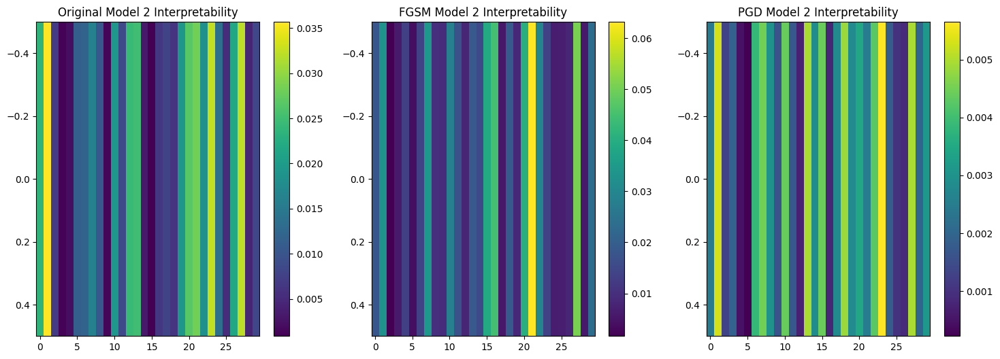

In [19]:
# Evaluate interpretability for the original and adversarially trained models
interpretability_original_1 = evaluate_interpretability(model_2, X_test, y_test)
interpretability_fgsm_1 = evaluate_interpretability(fgsm_model_2, X_test, y_test)
interpretability_pgd_1 = evaluate_interpretability(pgd_model_2, X_test, y_test)

# Plot the interpretability results
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(interpretability_original_1[0].reshape(1, -1), cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('Original Model 2 Interpretability')

plt.subplot(1, 3, 2)
plt.imshow(interpretability_fgsm_1[0].reshape(1, -1), cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('FGSM Model 2 Interpretability')

plt.subplot(1, 3, 3)
plt.imshow(interpretability_pgd_1[0].reshape(1, -1), cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('PGD Model 2 Interpretability')

plt.show()

Original Model 2: This map represents the model's feature importance using the original training data. The color intensity indicates the contribution of each feature to the model's predictions, with brighter areas indicating higher importance. This map suggests that Model 2 relies on a somewhat distributed set of features for its predictions, with certain features standing out more prominently.

FGSM Model 2: The saliency map after FGSM adversarial training shows an increase in the concentration of feature importance, as indicated by the brighter areas compared to the original model. This suggests that FGSM training has caused the model to focus more intensely on specific features, potentially as a defensive response to the adversarial examples introduced during training. This could indicate that the model is identifying certain features as more critical in distinguishing between classes when faced with adversarial conditions.

PGD Model 2: The PGD-trained model's saliency map exhibits a more evenly distributed color intensity across the features, with generally lower maximum values compared to the FGSM-trained model. This suggests that PGD adversarial training has led the model to distribute its focus more evenly across various features, rather than concentrating on specific ones. This distribution could indicate that the model has developed a more generalized approach to feature importance, potentially enhancing its robustness but also diluting the impact of the most discriminative features.

## Conclusion
In this exercise, we explored the breast cancer dataset by implementing and comparing various machine learning models, including neural networks. We emphasized adversarial training techniques, particularly using FGSM and PGD methods, to assess the robustness of the models against adversarial attacks. The results demonstrated a trade-off where adversarial training reduced overall model accuracy but enhanced resilience to adversarial examples. Additionally, we used LIME to interpret the models' predictions, highlighting which features were most influential in the decision-making process. The saliency maps provided further insights into how different models and training methods affect feature importance. Overall, the exercise underscored the need for robust models in critical applications, showcasing the strengths and limitations of different approaches to machine learning and model interpretability.
